# Basic way to click points on images

In [1]:
%load_ext autoreload
%autoreload 2
%matplotlib notebook
import matplotlib.pyplot as plt
import os
import sys
import imageio
import numpy as np
import json

In [2]:
def find_landmarks(image):
    fig1 = plt.figure(figsize=(10,6))
    ax = fig1.add_subplot(111)
    ax.imshow(image)
    text=ax.text(10,10, "", va="top", ha="left", color='w')

    landmarks = []
    timestamp = [0]
    def onclick(event):
        if event.button==3:
            landmarks.append([event.xdata, event.ydata])
            timestamp.append(timestamp[-1]+1)
            l = np.float32(landmarks)
            ax.plot(l[:,0], l[:,1], 'r.')
            
            text.set_text("{}\n{}".format(len(l), np.around(l, 1)))

    cid = fig1.canvas.mpl_connect('button_press_event', onclick)
    plt.show() # show() must be called after mpl_connect!
    
    return landmarks, timestamp[:-1]

In [12]:
views = ["6_1", '6_2', '6_3', '6_4']
image1 = imageio.imread("/Users/huguesvinzant/Documents/PHOM/PdM/Data/010920/6_3/Frames/frame_037000.png")

<IPython.core.display.Javascript object>


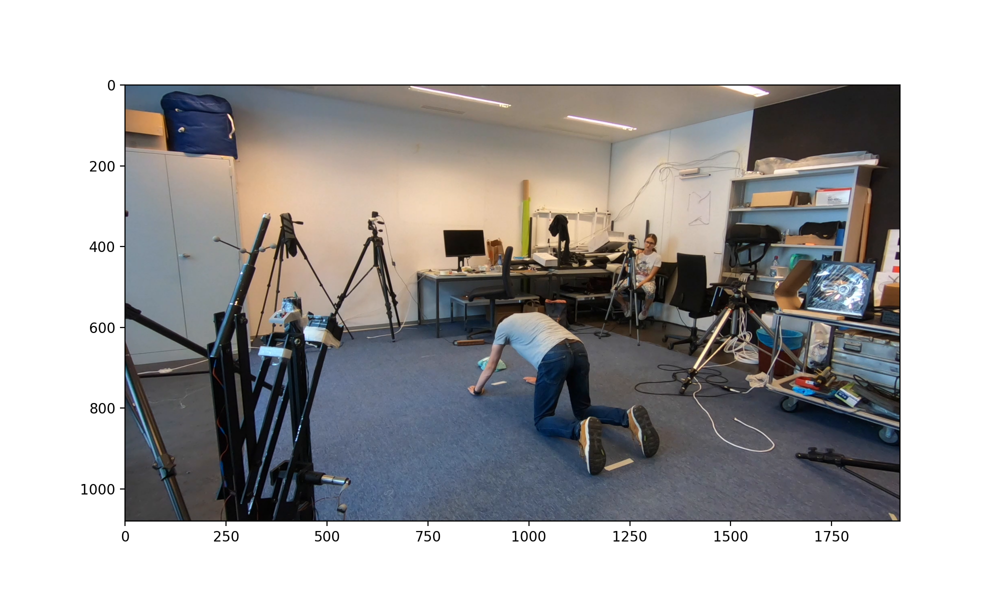

In [13]:
landmarks1, timestamp1 = find_landmarks(image1)

In [5]:
landmarks1, timestamp1

([[1709.4556961498438, 1052.017877211238],
  [1593.0358190196898, 712.9275659824046],
  [1141.878215333054, 919.5087138667782],
  [520.390741516548, 784.4239212400502],
  [568.2389635796045, 744.7248241415192]],
 [])

<IPython.core.display.Javascript object>


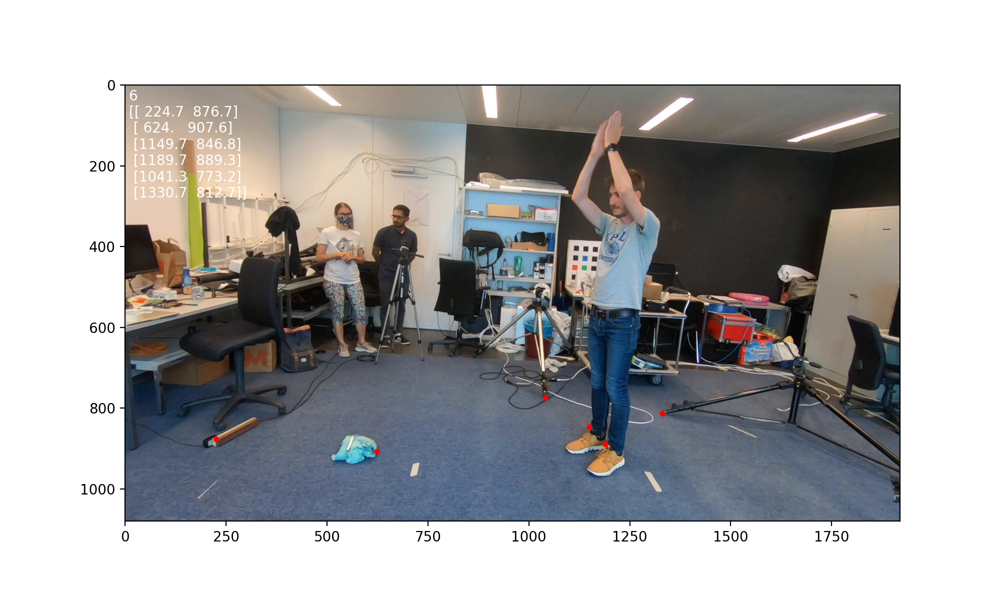

In [6]:
landmarks2, timestamp2 = find_landmarks(image2)

In [7]:
landmarks2, timestamp2

([[224.72371177209885, 876.7399664851276],
  [624.0203183912861, 907.5661918726432],
  [1149.6998324256388, 846.8395056556346],
  [1189.696564725597, 889.3024298282362],
  [1041.3340062434963, 773.1659479708636],
  [1330.7263091746963, 812.6674905739421]],
 [])

<IPython.core.display.Javascript object>


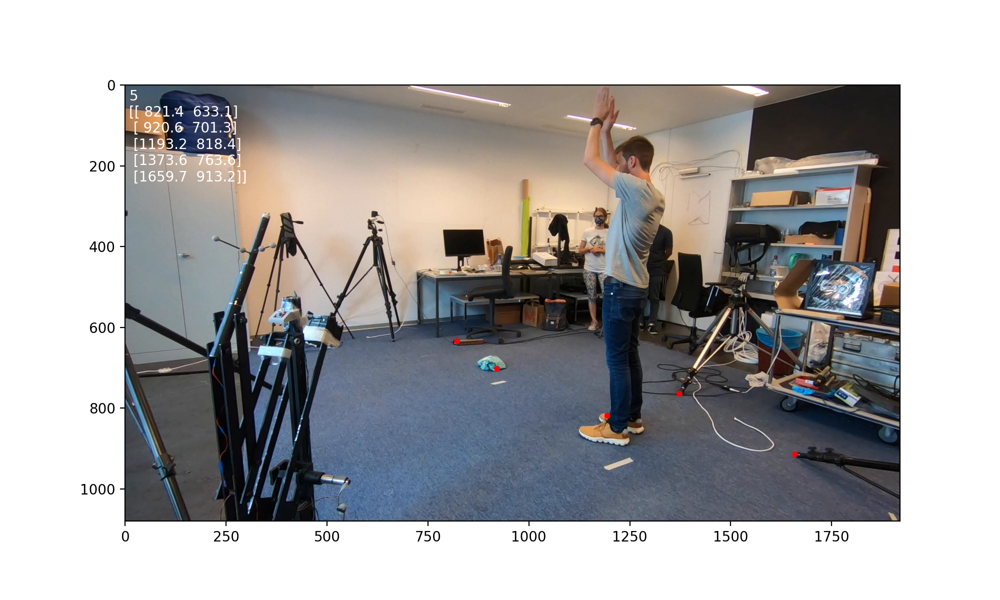

In [8]:
landmarks3, timestamp3 = find_landmarks(image3)

In [9]:
landmarks3, timestamp3

([[821.437159614579, 633.0745286971093],
  [920.5636782572267, 701.3080435693337],
  [1193.2416841223294, 818.411353162966],
  [1373.5756598240469, 763.6016338500209],
  [1659.7007540846248, 913.1586510263928]],
 [])

<IPython.core.display.Javascript object>


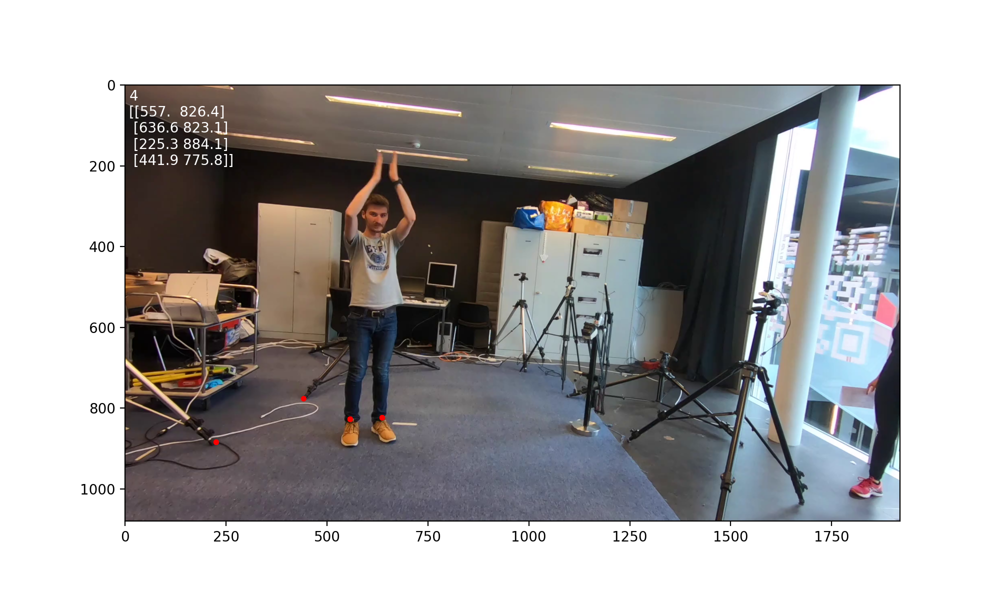

In [10]:
landmarks4, timestamp4 = find_landmarks(image4)

In [11]:
landmarks4, timestamp4

([[556.9842899036448, 826.4282781734394],
  [636.6189843912591, 823.0739604578563],
  [225.2777126099707, 884.0824046920818],
  [441.8710934227064, 775.8385839966484]],
 [])

In [12]:
landmarks = {
    views[0]:{"landmarks":landmarks1, "ids":[40, 41, 42, 43, 44]},  
    views[1]:{"landmarks":landmarks2, "ids":[40, 42, 43, 44, 45, 46]}, 
    views[2]:{"landmarks":landmarks3, "ids":[40, 42, 44, 45, 46]},
    views[3]:{"landmarks":landmarks4, "ids":[43, 44, 45, 46]},
}
landmarks

{'6_1': {'landmarks': [[1709.4556961498438, 1052.017877211238],
   [1593.0358190196898, 712.9275659824046],
   [1141.878215333054, 919.5087138667782],
   [520.390741516548, 784.4239212400502],
   [568.2389635796045, 744.7248241415192]],
  'ids': [40, 41, 42, 43, 44]},
 '6_2': {'landmarks': [[224.72371177209885, 876.7399664851276],
   [624.0203183912861, 907.5661918726432],
   [1149.6998324256388, 846.8395056556346],
   [1189.696564725597, 889.3024298282362],
   [1041.3340062434963, 773.1659479708636],
   [1330.7263091746963, 812.6674905739421]],
  'ids': [40, 42, 43, 44, 45, 46]},
 '6_3': {'landmarks': [[821.437159614579, 633.0745286971093],
   [920.5636782572267, 701.3080435693337],
   [1193.2416841223294, 818.411353162966],
   [1373.5756598240469, 763.6016338500209],
   [1659.7007540846248, 913.1586510263928]],
  'ids': [40, 42, 44, 45, 46]},
 '6_4': {'landmarks': [[556.9842899036448, 826.4282781734394],
   [636.6189843912591, 823.0739604578563],
   [225.2777126099707, 884.0824046920

In [13]:
with open(os.path.abspath("../examples/pose/landmarks_elements2.json"), 'w') as f:
    json.dump(landmarks, f, indent=2)